# بسم الله الرحمن الرحيم

# Pattern Recognation Final Project

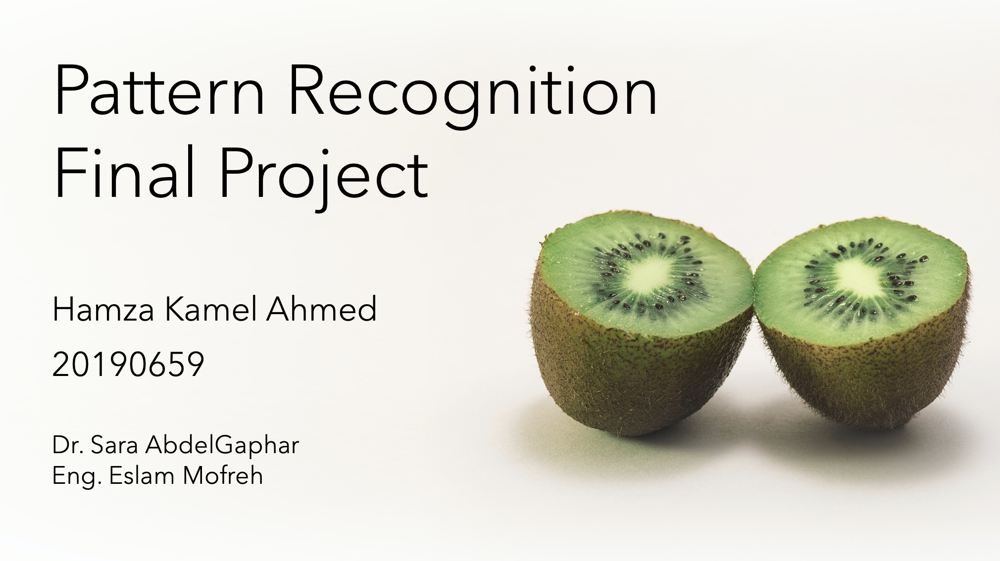

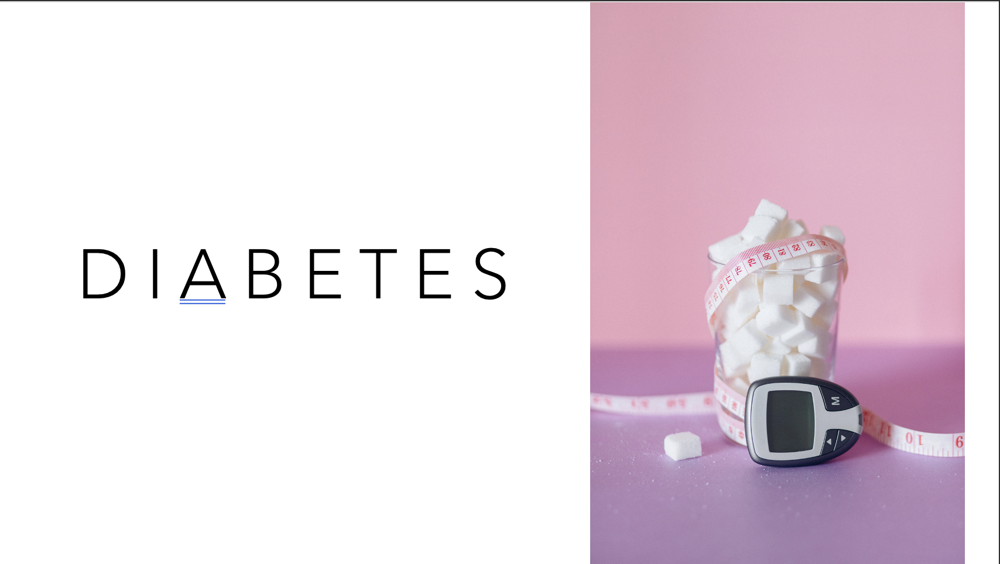

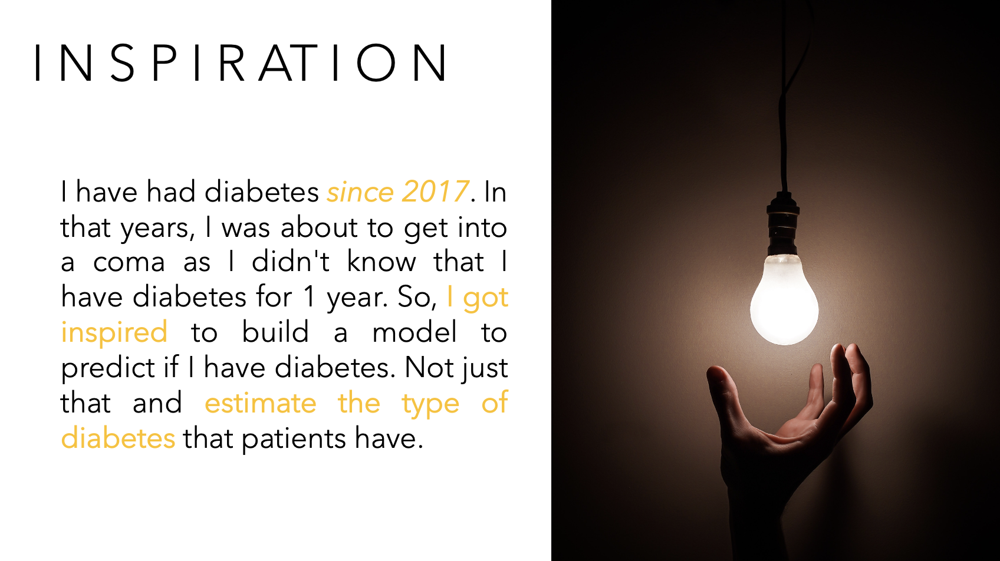

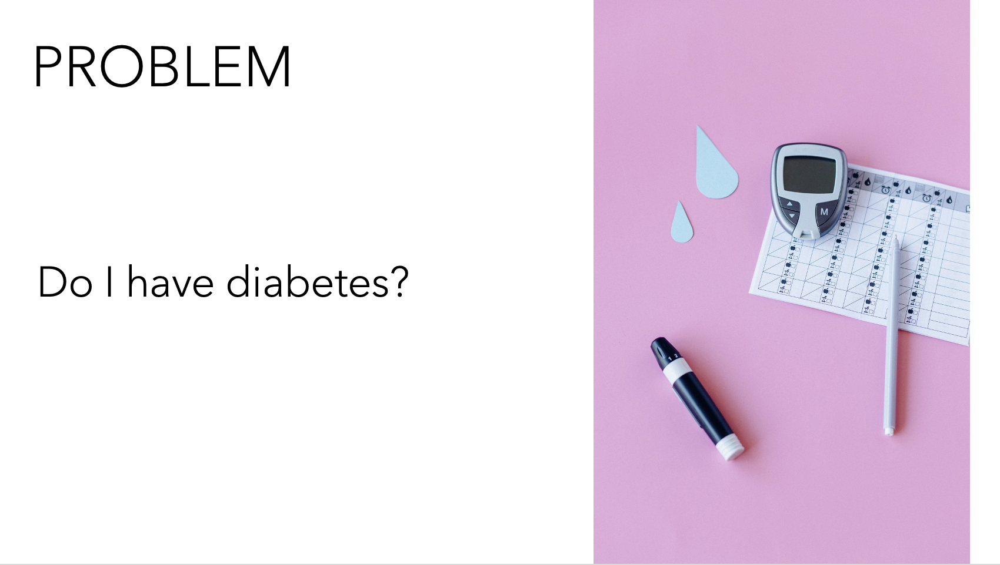

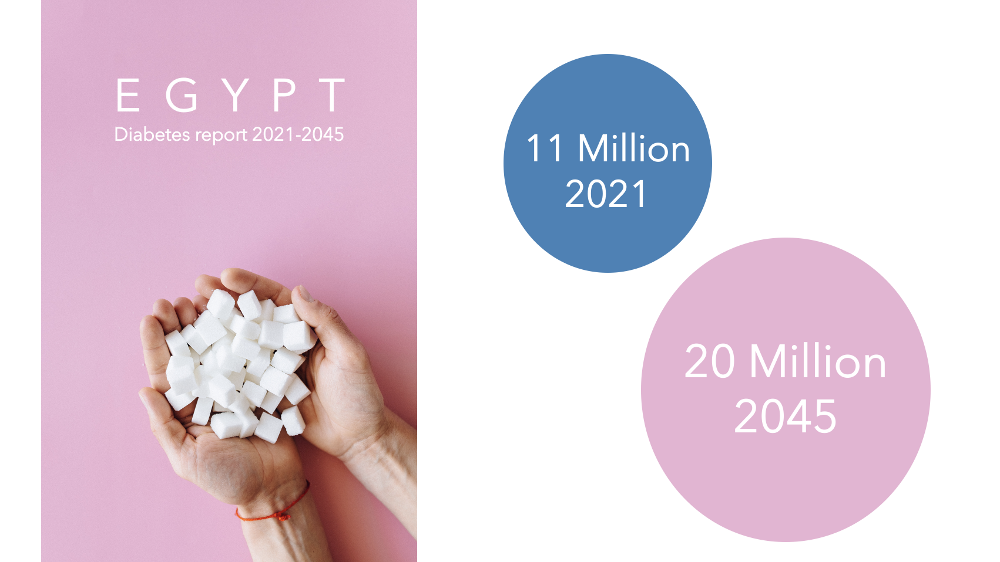

...

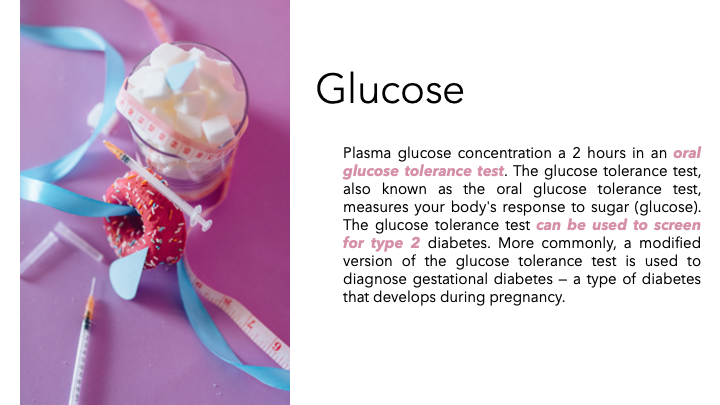

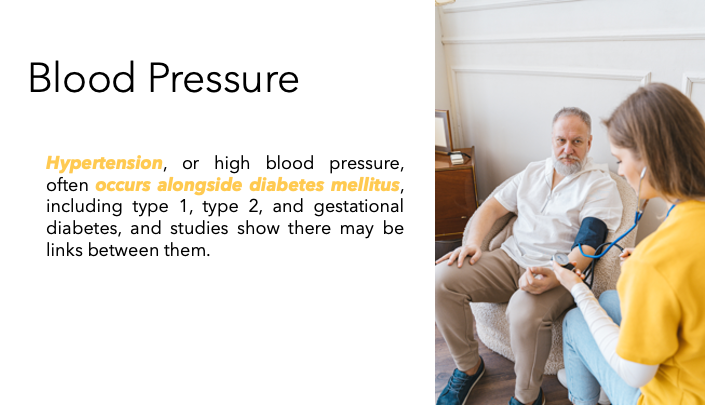

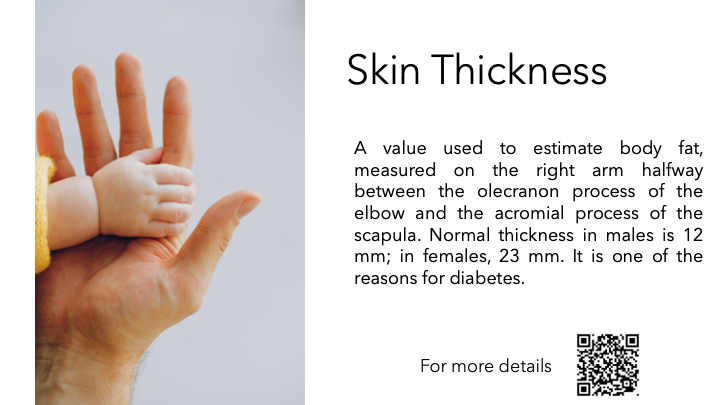

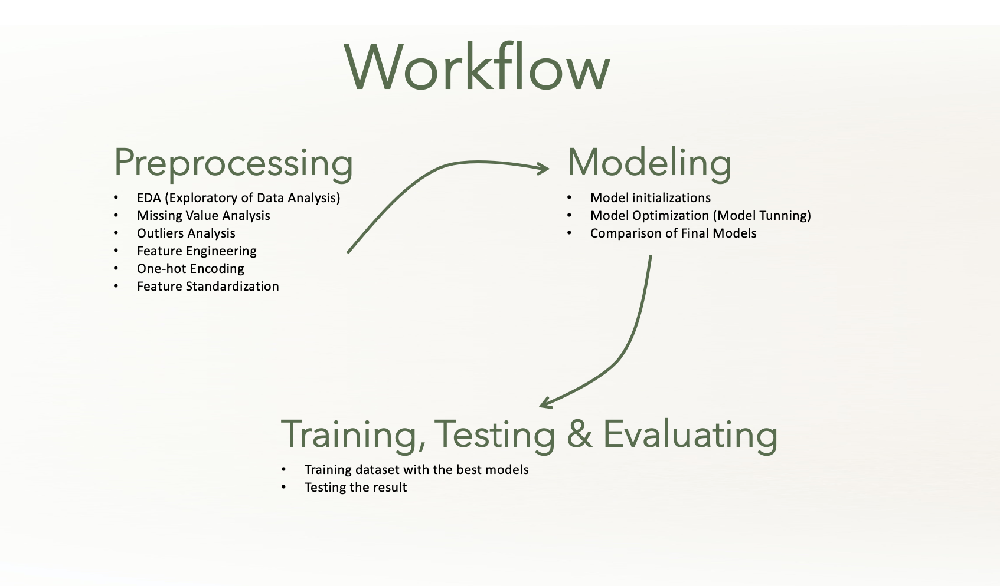

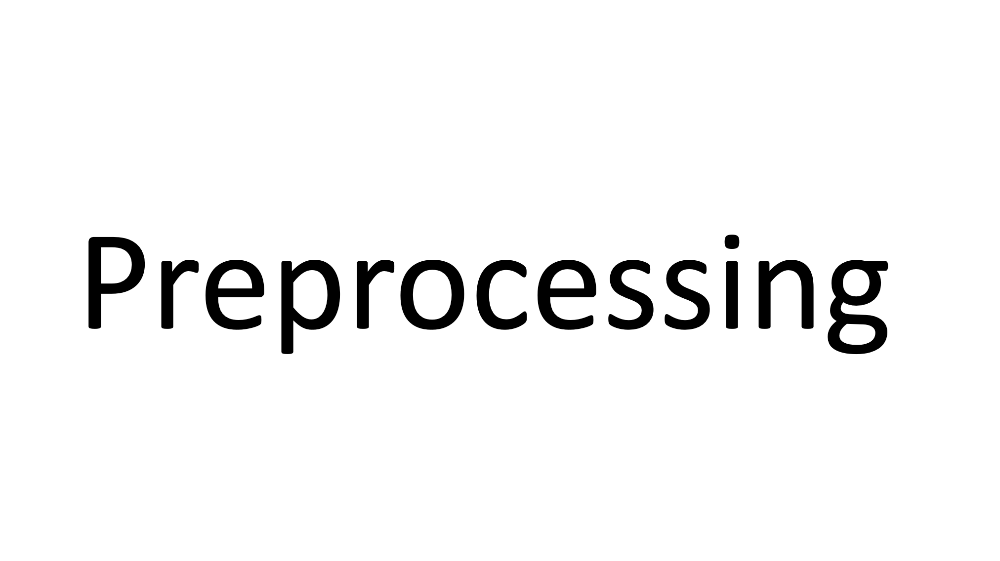

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import KFold
from subprocess import check_output

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=FutureWarning) 
warnings.filterwarnings("ignore", category=UserWarning) 

%config InlineBackend.figure_format = 'retina'

# to display all columns and rows:
pd.set_option('display.max_columns', None); pd.set_option('display.max_rows', None);  # to display all columns and rows
pd.set_option('display.float_format', lambda x: '%.2f' % x) # The number of numbers that will be shown after the comma.

#Exploratory of Data Analysis 

##Data preparation

In [ ]:
#Reading the dataset
df = pd.read_csv("diabetes.csv.xls")

In [ ]:
df.shape

(768, 9)

In [ ]:
df.describe([0.10,0.25,0.50,0.75,0.90,0.95,0.99]).T

,count,mean,std,min,10%,25%,50%,75%,90%,95%,99%,max
Pregnancies,768.00,3.85,3.37,0.00,0.00,1.00,3.00,6.00,9.00,10.00,13.00,17.00
Glucose,768.00,120.89,31.97,0.00,85.00,99.00,117.00,140.25,167.00,181.00,196.00,199.00
BloodPressure,768.00,69.11,19.36,0.00,54.00,62.00,72.00,80.00,88.00,90.00,106.00,122.00
SkinThickness,768.00,20.54,15.95,0.00,0.00,0.00,23.00,32.00,40.00,44.00,51.33,99.00
Insulin,768.00,79.80,115.24,0.00,0.00,0.00,30.50,127.25,210.00,293.00,519.90,846.00
BMI,768.00,31.99,7.88,0.00,23.60,27.30,32.00,36.60,41.50,44.39,50.76,67.10
DiabetesPedigreeFunction,768.00,0.47,0.33,0.08,0.17,0.24,0.37,0.63,0.88,1.13,1.70,2.42
Age,768.00,33.24,11.76,21.00,22.00,24.00,29.00,41.00,51.00,58.00,67.00,81.00
Outcome,768.00,0.35,0.48,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.00


In [ ]:
df["Outcome"].value_counts()*100/len(df)

0   65.10
1   34.90
Name: Outcome, dtype: float64

In [ ]:
df.Outcome.value_counts()

0    500
1    268
Name: Outcome, dtype: int64

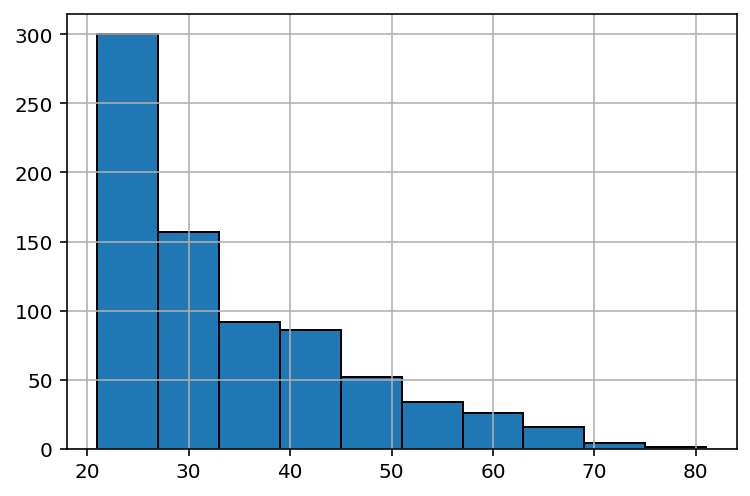

In [ ]:
df["Age"].hist(edgecolor = "black");

# Missing Value Analysis

In [ ]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [ ]:
df[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0, np.NaN)

In [ ]:
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

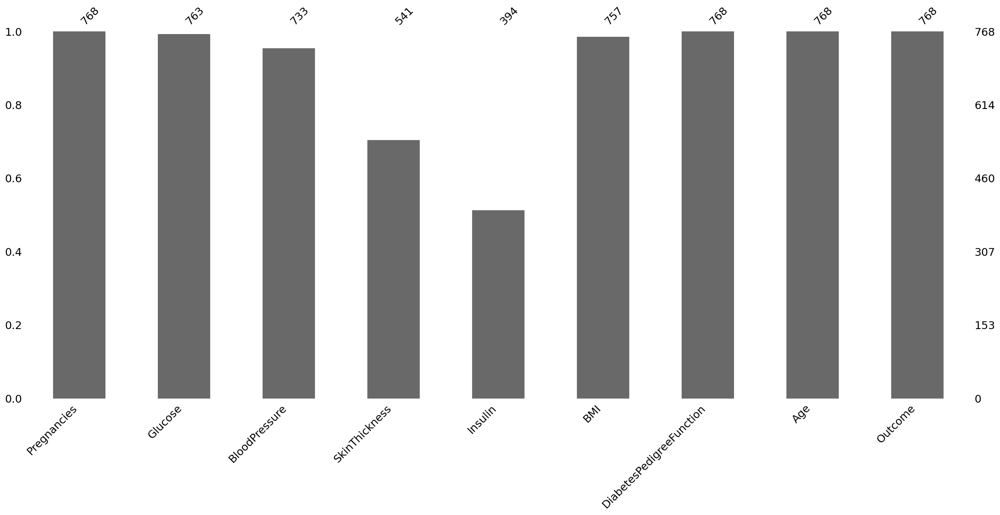

In [ ]:
import missingno as msno
msno.bar(df);

In [ ]:
def carp(x,y):
    
    z = x*y
    
    return z

In [ ]:
carp(4,5)

20

In [ ]:
# The missing values will be filled with the median values of each variable.

def median_target(var):   
    
    temp = df[df[var].notnull()]
    
    temp = temp[[var, 'Outcome']].groupby(['Outcome'])[[var]].median().reset_index()
    
    return temp

In [ ]:
columns = df.columns

columns = columns.drop("Outcome")

In [ ]:
columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [ ]:
median_target('Glucose')

,Outcome,Glucose
0,0,107.00
1,1,140.00


In [ ]:
# The values to be given for incomplete observations are given the median value of people who are not sick and the median values of people who are sick.

columns = df.columns

columns = columns.drop("Outcome")

for col in columns:
    
    df.loc[(df['Outcome'] == 0 ) & (df[col].isnull()), col] = median_target(col)[col][0]
    df.loc[(df['Outcome'] == 1 ) & (df[col].isnull()), col] = median_target(col)[col][1]

In [ ]:
df.loc[(df['Outcome'] == 0 ) & (df["Pregnancies"].isnull()), "Pregnancies"]

Series([], Name: Pregnancies, dtype: int64)

In [ ]:
df[(df['Outcome'] == 0 ) & (df["BloodPressure"].isnull())]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


# Calculate diabetes ratio of True/False from outcome variable

In [ ]:
n_true = len(df.loc[df['Outcome'] == True])
n_false = len(df.loc[df['Outcome'] == False])
print("Number of true cases: {0} ({1:2.2f}%)".format(n_true, (n_true / (n_true + n_false)) * 100 ))
print("Number of false cases: {0} ({1:2.2f}%)".format(n_false, (n_false / (n_true + n_false)) * 100))

Number of true cases: 268 (34.90%)
Number of false cases: 500 (65.10%)


# Spliting the data

In [ ]:
from sklearn.model_selection import train_test_split

features_cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
predicted_class = ['Outcome']

X = df[features_cols].values      # Predictor feature columns (8 X m)
Y = df[predicted_class]. values   # Predicted class (1=True, 0=False) (1 X m)
split_test_size = 0.30

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=split_test_size, random_state=52)
# I took 52 as just any random seed number

In [ ]:
print("{0:0.2f}% data is in training set".format((len(x_train)/len(df.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(x_test)/len(df.index)) * 100))

69.92% data is in training set
30.08% data is in test set


In [ ]:
print("Original Diabetes True Values    : {0} ({1:0.2f}%)".format(len(df.loc[df['Outcome'] == 1]), (len(df.loc[df['Outcome'] == 1])/len(df.index)) * 100))
print("Original Diabetes False Values   : {0} ({1:0.2f}%)".format(len(df.loc[df['Outcome'] == 0]), (len(df.loc[df['Outcome'] == 0])/len(df.index)) * 100))
print("")
print("Training Diabetes True Values    : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training Diabetes False Values   : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("")
print("Test Diabetes True Values        : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test Diabetes False Values       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))
print("")

Original Diabetes True Values    : 268 (34.90%)
Original Diabetes False Values   : 500 (65.10%)

Training Diabetes True Values    : 192 (35.75%)
Training Diabetes False Values   : 345 (64.25%)

Test Diabetes True Values        : 76 (32.90%)
Test Diabetes False Values       : 155 (67.10%)



# Next Step Outliers Analysis

## Why Outliers Analysis? 


### Outlier analysis is the process of identifying outliers, or abnormal observations, in a dataset. Also known as outlier detection, it’s an important step in data analysis, as it removes erroneous or inaccurate observations which might otherwise skew conclusions.

In [ ]:
Q1 = df["BloodPressure"].quantile(0.25)
Q3 = df["BloodPressure"].quantile(0.75)
IQR = Q3-Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

In [ ]:
lower

40.0

In [ ]:
upper

104.0

In [ ]:
df[(df["BloodPressure"] > upper)].any(axis=None)

True

In [ ]:
for feature in df:
    print(feature)

Pregnancies
Glucose
BloodPressure
SkinThickness
Insulin
BMI
DiabetesPedigreeFunction
Age
Outcome


In [ ]:
for feature in df:
    
    Q1 = df[feature].quantile(0.05)
    Q3 = df[feature].quantile(0.95)
    IQR = Q3 - Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    
    if df[(df[feature] > upper)].any(axis=None):
        print(feature,"yes")
    else:
        print(feature, "no")

Pregnancies no
Glucose no
BloodPressure no
SkinThickness yes
Insulin yes
BMI no
DiabetesPedigreeFunction no
Age no
Outcome no


In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.00,72.00,35.00,169.50,33.60,0.63,50,1
1,1,85.00,66.00,29.00,102.50,26.60,0.35,31,0
2,8,183.00,64.00,32.00,169.50,23.30,0.67,32,1
3,1,89.00,66.00,23.00,94.00,28.10,0.17,21,0
4,0,137.00,40.00,35.00,168.00,43.10,2.29,33,1


In [ ]:
df.shape

(768, 9)

# Next Step: Feature Engineering 

## Why Feature Engineering ? 

### Feature engineering refers to the process of using domain knowledge to select and transform the most relevant variables from raw data when creating a predictive model using machine learning or statistical modeling. The goal of feature engineering and selection in this project is to improve the performance of machine learning (ML) algorithms and modles that we will use.

In [ ]:
# According to BMI, some ranges were determined and categorical variables were assigned.
NewBMI = pd.Series(["Underweight", "Normal", "Overweight", "Obesity 1", "Obesity 2", "Obesity 3"], dtype = "category")

df["NewBMI"] = NewBMI

df.loc[df["BMI"] < 18.5, "NewBMI"] = NewBMI[0]

df.loc[(df["BMI"] > 18.5) & (df["BMI"] <= 24.9), "NewBMI"] = NewBMI[1]
df.loc[(df["BMI"] > 24.9) & (df["BMI"] <= 29.9), "NewBMI"] = NewBMI[2]
df.loc[(df["BMI"] > 29.9) & (df["BMI"] <= 34.9), "NewBMI"] = NewBMI[3]
df.loc[(df["BMI"] > 34.9) & (df["BMI"] <= 39.9), "NewBMI"] = NewBMI[4]
df.loc[df["BMI"] > 39.9 ,"NewBMI"] = NewBMI[5]

In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI
0,6,148.00,72.00,35.00,169.50,33.60,0.63,50,1,Obesity 1
1,1,85.00,66.00,29.00,102.50,26.60,0.35,31,0,Overweight
2,8,183.00,64.00,32.00,169.50,23.30,0.67,32,1,Normal
3,1,89.00,66.00,23.00,94.00,28.10,0.17,21,0,Overweight
4,0,137.00,40.00,35.00,168.00,43.10,2.29,33,1,Obesity 3


In [ ]:
def set_insulin(row):
    if row["Insulin"] >= 16 and row["Insulin"] <= 166:
        return "Normal"
    else:
        return "Abnormal"  

In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI
0,6,148.00,72.00,35.00,169.50,33.60,0.63,50,1,Obesity 1
1,1,85.00,66.00,29.00,102.50,26.60,0.35,31,0,Overweight
2,8,183.00,64.00,32.00,169.50,23.30,0.67,32,1,Normal
3,1,89.00,66.00,23.00,94.00,28.10,0.17,21,0,Overweight
4,0,137.00,40.00,35.00,168.00,43.10,2.29,33,1,Obesity 3


In [ ]:
df["NewInsulinScore"] = df.apply(set_insulin, axis=1)

In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI,NewInsulinScore
0,6,148.00,72.00,35.00,169.50,33.60,0.63,50,1,Obesity 1,Abnormal
1,1,85.00,66.00,29.00,102.50,26.60,0.35,31,0,Overweight,Normal
2,8,183.00,64.00,32.00,169.50,23.30,0.67,32,1,Normal,Abnormal
3,1,89.00,66.00,23.00,94.00,28.10,0.17,21,0,Overweight,Normal
4,0,137.00,40.00,35.00,168.00,43.10,2.29,33,1,Obesity 3,Abnormal


In [ ]:
# Some intervals were determined according to the glucose variable and these were assigned categorical variables.
NewGlucose = pd.Series(["Low", "Normal", "Overweight", "Secret", "High"], dtype = "category")

df["NewGlucose"] = NewGlucose

df.loc[df["Glucose"] <= 70, "NewGlucose"] = NewGlucose[0]

df.loc[(df["Glucose"] > 70) & (df["Glucose"] <= 99), "NewGlucose"] = NewGlucose[1]

df.loc[(df["Glucose"] > 99) & (df["Glucose"] <= 126), "NewGlucose"] = NewGlucose[2]

df.loc[df["Glucose"] > 126 ,"NewGlucose"] = NewGlucose[3]

In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI,NewInsulinScore,NewGlucose
0,6,148.00,72.00,35.00,169.50,33.60,0.63,50,1,Obesity 1,Abnormal,Secret
1,1,85.00,66.00,29.00,102.50,26.60,0.35,31,0,Overweight,Normal,Normal
2,8,183.00,64.00,32.00,169.50,23.30,0.67,32,1,Normal,Abnormal,Secret
3,1,89.00,66.00,23.00,94.00,28.10,0.17,21,0,Overweight,Normal,Normal
4,0,137.00,40.00,35.00,168.00,43.10,2.29,33,1,Obesity 3,Abnormal,Secret


 # Next Step: One-hot Encoding
 ## Why  One-hot Encoding ? 

 ### One hot encoding can be defined as the essential process of converting the categorical data variables to be provided to machine and deep learning algorithms which in turn improve predictions as well as classification accuracy of a models in this project. One Hot Encoding is for preprocessing categorical features for machine learning models.

In [ ]:
df = pd.get_dummies(df, columns =["NewBMI","NewInsulinScore", "NewGlucose"], drop_first = True)

In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,NewBMI_Obesity 1,NewBMI_Obesity 2,NewBMI_Obesity 3,NewBMI_Overweight,NewBMI_Underweight,NewInsulinScore_Normal,NewGlucose_Low,NewGlucose_Normal,NewGlucose_Overweight,NewGlucose_Secret
0,6,148.00,72.00,35.00,169.50,33.60,0.63,50,1,1,0,0,0,0,0,0,0,0,1
1,1,85.00,66.00,29.00,102.50,26.60,0.35,31,0,0,0,0,1,0,1,0,1,0,0
2,8,183.00,64.00,32.00,169.50,23.30,0.67,32,1,0,0,0,0,0,0,0,0,0,1
3,1,89.00,66.00,23.00,94.00,28.10,0.17,21,0,0,0,0,1,0,1,0,1,0,0
4,0,137.00,40.00,35.00,168.00,43.10,2.29,33,1,0,0,1,0,0,0,0,0,0,1


In [ ]:
categorical_df = df[['NewBMI_Obesity 1','NewBMI_Obesity 2', 'NewBMI_Obesity 3', 'NewBMI_Overweight','NewBMI_Underweight',
                     'NewInsulinScore_Normal','NewGlucose_Low','NewGlucose_Normal', 'NewGlucose_Overweight', 'NewGlucose_Secret']]

# Next Step is Feature Standartization 

In [ ]:
y = df["Outcome"]
X = df.drop(["Outcome",'NewBMI_Obesity 1','NewBMI_Obesity 2', 'NewBMI_Obesity 3', 'NewBMI_Overweight','NewBMI_Underweight',
                     'NewInsulinScore_Normal','NewGlucose_Low','NewGlucose_Normal', 'NewGlucose_Overweight', 'NewGlucose_Secret'], axis = 1)
cols = X.columns
index = X.index

In [ ]:
y.head()

0    1
1    0
2    1
3    0
4    1
Name: Outcome, dtype: int64

In [ ]:
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.00,72.00,35.00,169.50,33.60,0.63,50
1,1,85.00,66.00,29.00,102.50,26.60,0.35,31
2,8,183.00,64.00,32.00,169.50,23.30,0.67,32
3,1,89.00,66.00,23.00,94.00,28.10,0.17,21
4,0,137.00,40.00,35.00,168.00,43.10,2.29,33


In [ ]:
cols

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [ ]:
index

RangeIndex(start=0, stop=768, step=1)

In [ ]:
from sklearn.preprocessing import RobustScaler
transformer = RobustScaler().fit(X)
X = transformer.transform(X)
X = pd.DataFrame(X, columns = cols, index = index)

In [ ]:
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.60,0.77,0.00,1.00,1.00,0.17,0.67,1.24
1,-0.40,-0.79,-0.38,0.14,0.00,-0.60,-0.06,0.12
2,1.00,1.63,-0.50,0.57,1.00,-0.96,0.78,0.18
3,-0.40,-0.69,-0.38,-0.71,-0.13,-0.43,-0.54,-0.47
4,-0.60,0.49,-2.00,1.00,0.98,1.21,5.01,0.24


In [ ]:
X = pd.concat([X, categorical_df], axis = 1)

In [ ]:
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,NewBMI_Obesity 1,NewBMI_Obesity 2,NewBMI_Obesity 3,NewBMI_Overweight,NewBMI_Underweight,NewInsulinScore_Normal,NewGlucose_Low,NewGlucose_Normal,NewGlucose_Overweight,NewGlucose_Secret
0,0.60,0.77,0.00,1.00,1.00,0.17,0.67,1.24,1,0,0,0,0,0,0,0,0,1
1,-0.40,-0.79,-0.38,0.14,0.00,-0.60,-0.06,0.12,0,0,0,1,0,1,0,1,0,0
2,1.00,1.63,-0.50,0.57,1.00,-0.96,0.78,0.18,0,0,0,0,0,0,0,0,0,1
3,-0.40,-0.69,-0.38,-0.71,-0.13,-0.43,-0.54,-0.47,0,0,0,1,0,1,0,1,0,0
4,-0.60,0.49,-2.00,1.00,0.98,1.21,5.01,0.24,0,0,1,0,0,0,0,0,0,1


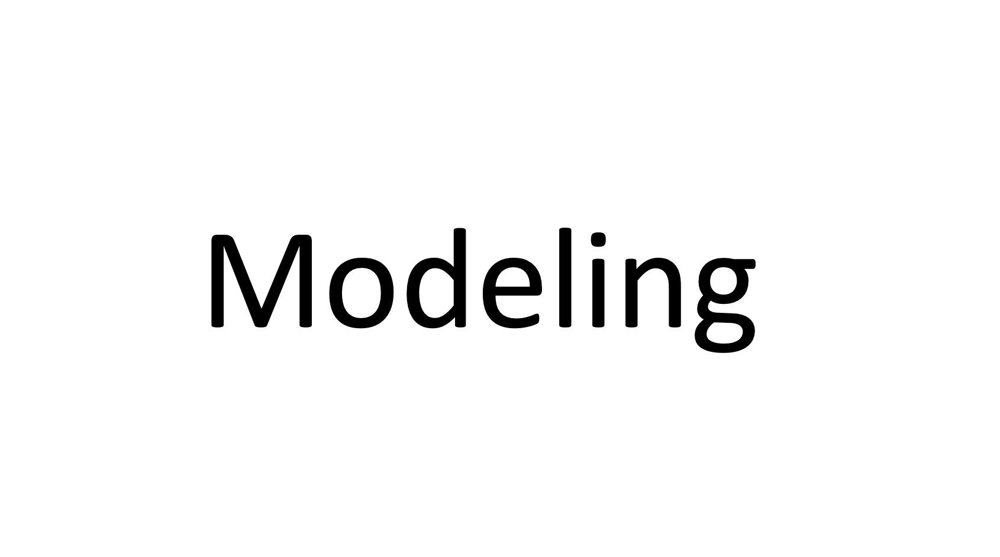

# The most important Step: Model
## models used: 

###1- LogisticRegression
###2-KNeighborsClassifier
###3-DecisionTreeClassifier
###4-RandomForestClassifier
###5-SVM
###6-GradientBoostingClassifier 
###7-LGBMClassifier




LR: 0.847539 (0.032028)
KNN: 0.837235 (0.031427)
CART: 0.838602 (0.026456)
RF: 0.878947 (0.030074)
SVM: 0.848855 (0.035492)
XGB: 0.880297 (0.029243)
LightGBM: 0.885526 (0.035487)


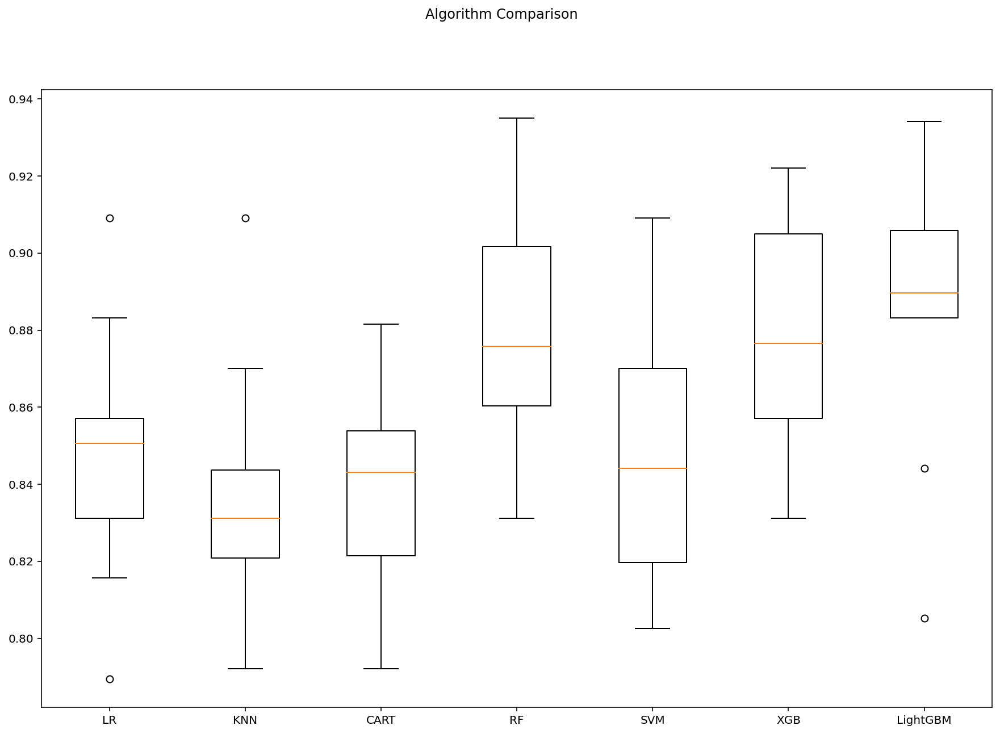

In [ ]:
models = []
models.append(('LR', LogisticRegression(random_state = 12345)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier(random_state = 12345)))
models.append(('RF', RandomForestClassifier(random_state = 12345)))
models.append(('SVM', SVC(gamma='auto', random_state = 12345)))
models.append(('XGB', GradientBoostingClassifier(random_state = 12345)))
models.append(("LightGBM", LGBMClassifier(random_state = 12345)))

# evaluate each model in turn
results = []
names = []

for name, model in models:
    
        cv_results = cross_val_score(model, X, y, cv = 10, scoring= "accuracy")
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
        
# boxplot algorithm comparison
fig = plt.figure(figsize=(15,10))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# Results explanation: 

From the previous results and graph, we can take the best 3 models to compare them and see what is the best model that uses most of the parameters of the dataset to predict if the patient has diabetes or not.

# The best Models are: 

### 1- RandomForestClassifier 
### 2- LGBMClassifier 
### 3- GradientBoostingClassifier

# Model Optimization - Model Tuning 

## What is Model Tuning ?
### Tuning is the process of maximizing a model's performance without overfitting or creating too high of a variance for the results. 




# Model Tuning (1): Random Forests Tuning 


In [ ]:
rf_params = {"n_estimators" :[100,200,500,1000], 
             "max_features": [3,5,7], 
             "min_samples_split": [2,5,10,30],
            "max_depth": [3,5,8,None]}

In [ ]:
rf_model = RandomForestClassifier(random_state = 12345)

In [ ]:
gs_cv = GridSearchCV(rf_model, 
                    rf_params,
                    cv = 10,
                    n_jobs = -1,
                    verbose = 2).fit(X, y)

Fitting 10 folds for each of 192 candidates, totalling 1920 fits


In [ ]:
gs_cv.best_params_

{'max_depth': None,
 'max_features': 7,
 'min_samples_split': 5,
 'n_estimators': 500}

# Random Forests Tuning - Final Model

In [ ]:
rf_tuned = RandomForestClassifier(**gs_cv.best_params_)

In [ ]:
rf_tuned = rf_tuned.fit(X,y)

In [ ]:
cross_val_score(rf_tuned, X, y, cv = 10).mean()

0.8880895420369104

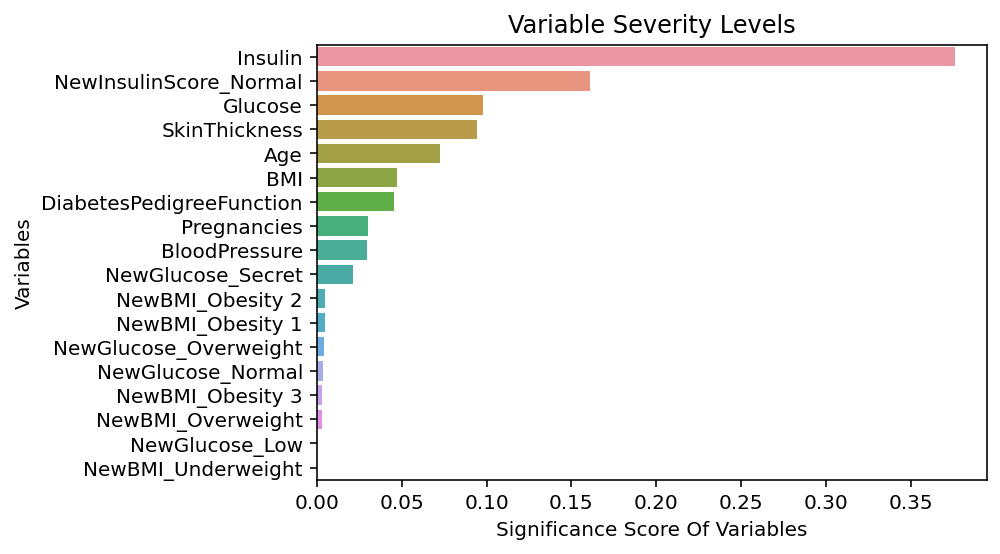

In [ ]:
feature_imp = pd.Series(rf_tuned.feature_importances_,
                        index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Significance Score Of Variables')
plt.ylabel('Variables')
plt.title("Variable Severity Levels")
plt.show()

# Model Tuning (2): LightGBM Model Tuning

In [ ]:
lgbm = LGBMClassifier(random_state = 12345)

In [ ]:
lgbm_params = {"learning_rate": [0.01, 0.03, 0.05, 0.1, 0.5],
              "n_estimators": [500, 1000, 1500],
              "max_depth":[3,5,8]}

In [ ]:
gs_cv = GridSearchCV(lgbm, 
                     lgbm_params, 
                     cv = 10, 
                     n_jobs = -1, 
                     verbose = 2).fit(X, y)

Fitting 10 folds for each of 45 candidates, totalling 450 fits


In [ ]:
gs_cv.best_params_

{'learning_rate': 0.01, 'max_depth': 8, 'n_estimators': 500}

#LightGBM Model Tuning - Final Model

In [ ]:
lgbm_tuned = LGBMClassifier(**gs_cv.best_params_).fit(X,y)

In [ ]:
cross_val_score(lgbm_tuned, X, y, cv = 10).mean()

0.8959330143540669

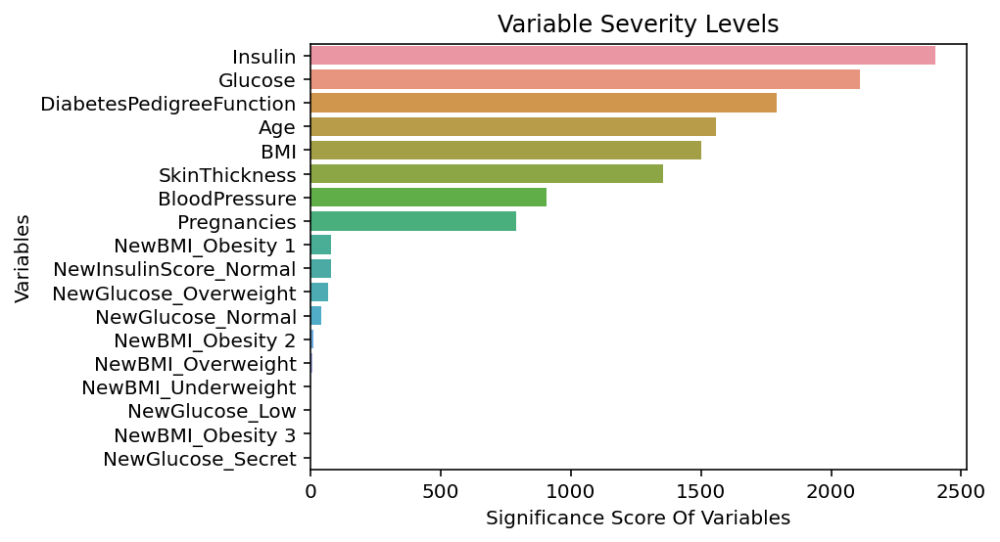

In [ ]:
feature_imp = pd.Series(lgbm_tuned.feature_importances_,
                        index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Significance Score Of Variables')
plt.ylabel('Variables')
plt.title("Variable Severity Levels")
plt.show()

# Model Tuning (3): XGBoost Model Tuning

In [ ]:
xgb = GradientBoostingClassifier(random_state = 12345)

In [ ]:
xgb_params = {
    "learning_rate": [0.01, 0.1, 0.2, 1],
    "min_samples_split": np.linspace(0.1, 0.5, 10),
    "max_depth":[3,5,8],
    "subsample":[0.5, 0.9, 1.0],
    "n_estimators": [100,1000]}

In [ ]:
xgb_cv_model  = GridSearchCV(xgb,xgb_params, cv = 10, n_jobs = -1, verbose = 2).fit(X, y)

Fitting 10 folds for each of 720 candidates, totalling 7200 fits


In [ ]:
xgb_cv_model.best_params_

{'learning_rate': 0.01,
 'max_depth': 8,
 'min_samples_split': 0.1,
 'n_estimators': 1000,
 'subsample': 1.0}

# XGBoost - Final Model

In [ ]:
xgb_tuned = GradientBoostingClassifier(**xgb_cv_model.best_params_).fit(X,y)

In [ ]:
cross_val_score(xgb_tuned, X, y, cv = 10).mean()

0.8971633629528366

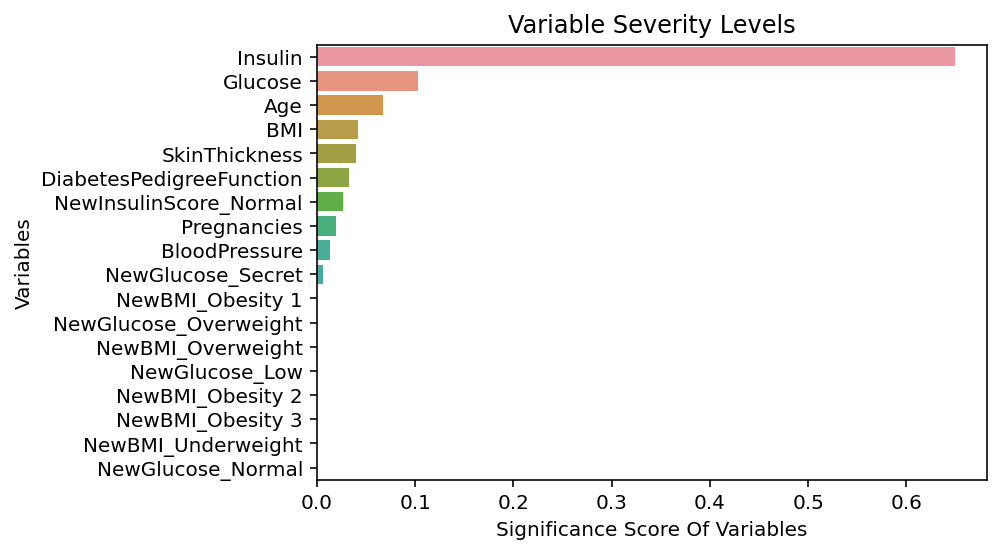

In [ ]:
feature_imp = pd.Series(xgb_tuned.feature_importances_,
                        index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Significance Score Of Variables')
plt.ylabel('Variables')
plt.title("Variable Severity Levels")
plt.show()

# Comparison of Final Models 

In [ ]:
models = []

models.append(('RF', RandomForestClassifier(random_state = 12345, max_depth = 8, max_features = 7, min_samples_split = 2, n_estimators = 500)))
models.append(('XGB', GradientBoostingClassifier(random_state = 12345, learning_rate = 0.1, max_depth = 5, min_samples_split = 0.1, n_estimators = 100, subsample = 1.0)))
models.append(("LightGBM", LGBMClassifier(random_state = 12345, learning_rate = 0.01,  max_depth = 3, n_estimators = 1000)))

# evaluate each model in turn
results = []
names = []

RF: 0.886791 (0.028298)
XGB: 0.886757 (0.021597)
LightGBM: 0.892003 (0.033222)


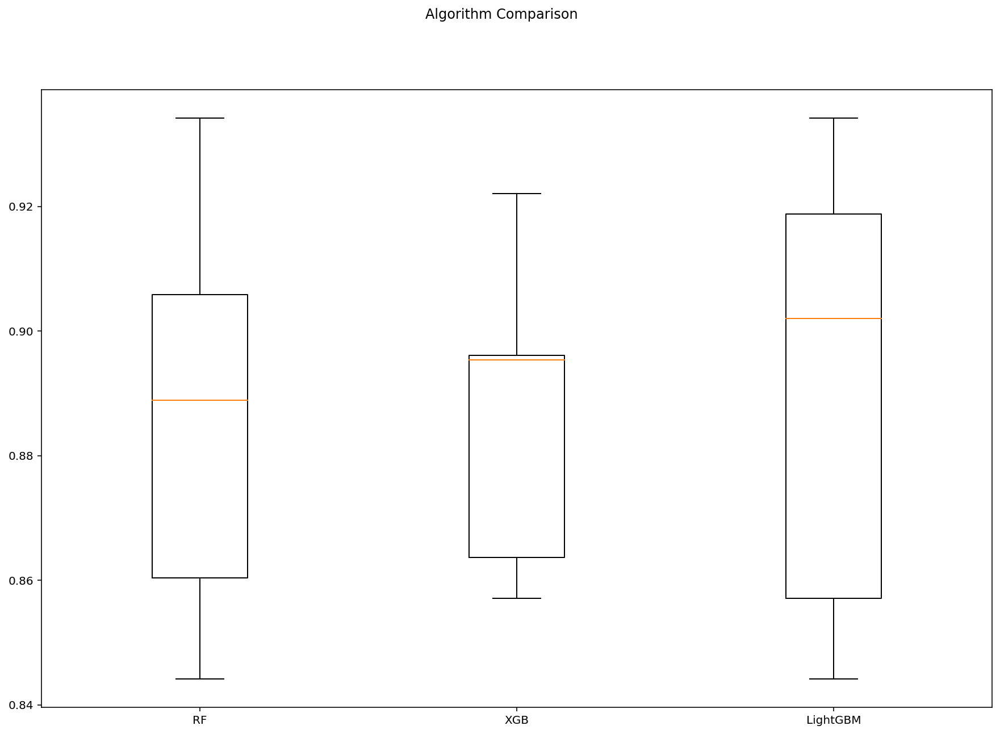

In [ ]:
for name, model in models:
    
        cv_results = cross_val_score(model, X, y, cv = 10, scoring= "accuracy")
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
        
# boxplot algorithm comparison
fig = plt.figure(figsize=(15,10))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

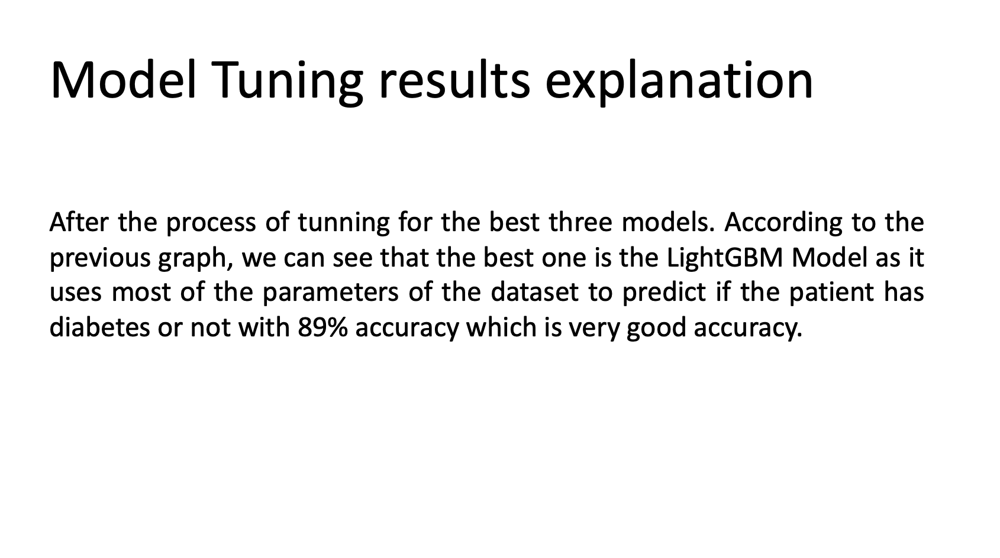

# Train Random Forest Algorithm

In [ ]:
from sklearn.ensemble import RandomForestClassifier
diab_rf_model = RandomForestClassifier(random_state=52)
diab_rf_model.fit(x_train, y_train.ravel())

RandomForestClassifier(random_state=52)

## Training data prediction

In [ ]:
from sklearn import metrics


In [ ]:
rf_train_predict = diab_rf_model.predict(x_train)
print("Model Accuracy: {0:.2f}".format(metrics.accuracy_score(y_train, rf_train_predict)))

Model Accuracy: 1.00


## Testing data prediction

In [ ]:
rf_test_predict = diab_rf_model.predict(x_test)
print("Model Accuracy: {0:.2f}".format(metrics.accuracy_score(y_test, rf_test_predict)))

Model Accuracy: 0.75


In [ ]:
print("Confusion Matrix")
print(metrics.confusion_matrix(y_test, rf_test_predict, labels=[1, 0]))
print("")
print("Classification Report")
print(metrics.classification_report(y_test, rf_test_predict, labels=[1, 0]))

Confusion Matrix
[[ 45  31]
 [ 26 129]]

Classification Report
              precision    recall  f1-score   support

           1       0.63      0.59      0.61        76
           0       0.81      0.83      0.82       155

    accuracy                           0.75       231
   macro avg       0.72      0.71      0.72       231
weighted avg       0.75      0.75      0.75       231



# Train LGBMClassifier


In [ ]:
diab_LGBMClassifier_model = LGBMClassifier(random_state = 12345)
diab_LGBMClassifier_model.fit(x_train, y_train.ravel())


LGBMClassifier(random_state=12345)

## Training data prediction

In [ ]:
LGBMClassifier_train_predict = diab_LGBMClassifier_model.predict(x_train)
print("Model Accuracy: {0:.2f}".format(metrics.accuracy_score(y_train, rf_train_predict)))

Model Accuracy: 1.00


## Testing data prediction

In [ ]:
LGBMClassifier_test_predict = diab_LGBMClassifier_model.predict(x_test)
print("Model Accuracy: {0:.2f}".format(metrics.accuracy_score(y_test, LGBMClassifier_test_predict)))

Model Accuracy: 0.76


In [ ]:
print("Confusion Matrix")
print(metrics.confusion_matrix(y_test, LGBMClassifier_test_predict, labels=[1, 0]))
print("")
print("Classification Report")
print(metrics.classification_report(y_test, LGBMClassifier_test_predict, labels=[1, 0]))

Confusion Matrix
[[ 51  25]
 [ 30 125]]

Classification Report
              precision    recall  f1-score   support

           1       0.63      0.67      0.65        76
           0       0.83      0.81      0.82       155

    accuracy                           0.76       231
   macro avg       0.73      0.74      0.73       231
weighted avg       0.77      0.76      0.76       231



# Train GradientBoosting


In [ ]:
diab_GradientBoostingClassifier_model = GradientBoostingClassifier(random_state = 12345)
diab_GradientBoostingClassifier_model.fit(x_train, y_train.ravel())


GradientBoostingClassifier(random_state=12345)

## Training data prediction

In [ ]:
GradientBoostingClassifier_train_predict = diab_GradientBoostingClassifier_model.predict(x_train)
print("Model Accuracy: {0:.2f}".format(metrics.accuracy_score(y_train, GradientBoostingClassifier_train_predict)))

Model Accuracy: 0.92


## Testing data prediction

In [ ]:
GradientBoostingClassifier_test_predict = diab_GradientBoostingClassifier_model.predict(x_test)
print("Model Accuracy: {0:.2f}".format(metrics.accuracy_score(y_test, GradientBoostingClassifier_test_predict)))

Model Accuracy: 0.72


In [ ]:
print("Confusion Matrix")
print(metrics.confusion_matrix(y_test, GradientBoostingClassifier_test_predict, labels=[1, 0]))
print("")
print("Classification Report")
print(metrics.classification_report(y_test, GradientBoostingClassifier_test_predict, labels=[1, 0]))

Confusion Matrix
[[ 41  35]
 [ 29 126]]

Classification Report
              precision    recall  f1-score   support

           1       0.59      0.54      0.56        76
           0       0.78      0.81      0.80       155

    accuracy                           0.72       231
   macro avg       0.68      0.68      0.68       231
weighted avg       0.72      0.72      0.72       231



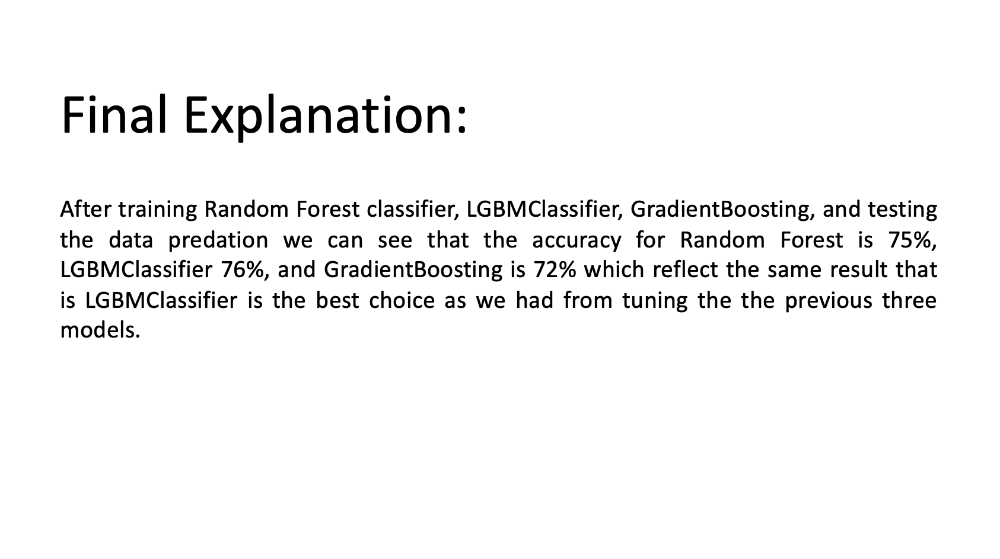

# الحمد لله